## 0. Introduction 

The aim of this lab is to get familiar with **Mixture of Gaussians** model. 


1.   This lab is the course-work activity **Assignment 2: Unsupervised Learning(20%)**
2. The Assignment is due on **Friday , 9th December, 11:59pm**
2.   A report answering the <font color = 'red'>**questions in</font><font color = "maroon"> red**</font> should be submitted on QMplus along with the completed Notebook.
3. The report should be a separate file in **pdf format** (so **NOT** *doc, docx, notebook* etc.), well identified with your name, student number, assignment number (for instance, Assignment 1), module code.
4. Make sure that **any figures or code** you comment on, are **included in the report**.
5. No other means of submission other than the appropriate QM+ link is acceptable at any time (so NO email attachments, etc.)
6. **PLAGIARISM** <ins>is an irreversible non-negotiable failure in the course</ins> (if in doubt of what constitutes plagiarism, ask!). 

In [3144]:
import os
import numpy as np
import scipy
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt
from IPython import display
%matplotlib inline
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn import metrics

For this lab, we will use the Peterson and Barney’s dataset of vowel formant frequencies. (For more info, look at Classification of Peterson & Barney’s vowels using Weka. - a copy of this article is on QMplus)

More specifically, Peterson and Barney measured the fundamental frequency $F0$ and the first three formant frequencies ($F1-F3$) of sustained English Vowels, using samples from various speakers.

Upload the .npy file and load it using the code block below.

In [3145]:
#from google.colab import files
#files.upload()
data_npy_file = 'PB_data.npy'

# Loading data from .npy file
data = np.load(data_npy_file, allow_pickle=True)

In [3146]:
data

array({'f3': array([2850, 2790, 2640, ..., 3380, 2160, 2200], dtype=uint16), 'f2': array([2280, 2400, 2030, ..., 1140, 1850, 1830], dtype=uint16), 'f1': array([240, 280, 390, ..., 500, 740, 660], dtype=uint16), 'f0': array([160, 186, 203, ..., 334, 308, 328], dtype=uint16), 'phoneme_id': array([ 1,  1,  2, ...,  9, 10, 10], dtype=uint8)},
      dtype=object)

The dataset contains 4 vectors ($F0-F3$), containing the fundamental frequencies ($F0$, $F1$, $F2$ and $F3$) for each phoneme and another vector “phoneme\_id” containing a number representing the id of the phoneme.

In the exercises that follow, we will use only the dataset associated with formants $F1$ and $F2$.

**Note**: Phonemes and Frequencies are two different things; phoneme_id is the ground truth class of each row while frequencies represent features of each data point. Please review the papers provided with the lab materials for more details.

In [3147]:
data = np.ndarray.tolist(data)
# Array that contains the phoneme ID (1-10) of each sample
phoneme_id = data['phoneme_id']

# frequencies f1 and f2
f1 = data['f1']
f2 = data['f2']

### <font color="maroon"> Q1. Produce a plot of $F1$ against $F2$. (You should be able to spot some clusters already in this scatter plot.). Comment on the figure and the visible clusters [2 marks]</font>

Minimum: 190.00 Mean: 563.30 Max: 1300.00 Std: 201.1881 & Shape: 1520
Minimum: 560.00 Mean: 1624.38 Max: 3610.00 Std: 636.8032 & Shape: 1520


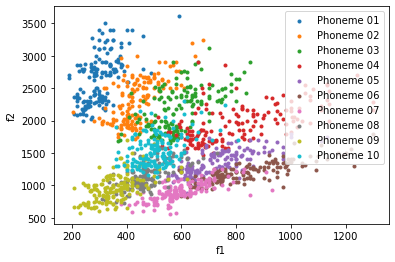

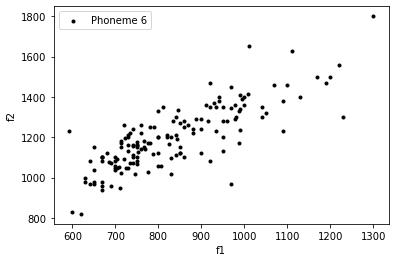

In [3148]:
### your code here
def display_stats(ndarray):
    minimum = np.min(ndarray)
    mean = np.mean(ndarray)
    maximum = np.max(ndarray)
    std = np.std(ndarray)
    shape_str = ''
    dim = ndarray.ndim
    for i in range(dim):
        shape_str = shape_str + '{}x'.format(ndarray.shape[i])
    shape_str = shape_str[:-1]
    display_str = 'Minimum: {:.{n}f} Mean: {:.{n}f} Max: {:.{n}f} Std: {:.4f} & Shape: {}'.format(minimum,mean,maximum,std,shape_str, n=2)
    print(display_str)

def plot_data_all_phonemes(X, phoneme_id, ax):
    ax.clear()
    ax.set_xlabel('f1')
    ax.set_ylabel('f2')
    unique_ids = np.unique(phoneme_id)
    N_ids = len(unique_ids)

    for ph_id in unique_ids:
        phoneme_string = 'Phoneme {:02}'.format(ph_id)
        ax.scatter(X[phoneme_id==ph_id,0], X[phoneme_id==ph_id,1], marker='.', label=phoneme_string)
    ax.legend()
    plt.pause(0.001)
    
def plot_data(X, title_string, ax):
    ax.clear()
    ax.set_xlabel('f1')
    ax.set_ylabel('f2')
    ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)
    ax.legend()
    plt.pause(0.001)

display_stats(f1)
display_stats(f2)
X_full = np.zeros((len(f1), 2))
X_full[:, 0] = f1
X_full[:, 1] = f2
X_full = X_full.astype(np.float32)
p_id = 6
X_phoneme_1 = X_full[phoneme_id == p_id, :]
fig, ax1 = plt.subplots()
plot_data_all_phonemes(X=X_full, phoneme_id=phoneme_id, ax=ax1)

# Create a figure and a subplot
fig, ax2 = plt.subplots()
title_string = 'Phoneme 6'

# plot the samples of the dataset, belonging to phoneme 1 (f1 & f2, phoneme 1)
plot_data(X=X_phoneme_1, title_string=title_string, ax=ax2)

In [3149]:
X_phoneme_2 = X_full[phoneme_id == 2, :]
plot_data(X=X_phoneme_2, title_string=title_string, ax=ax2)

In [3150]:
X_phoneme_3 = X_full[phoneme_id == 3, :]
plot_data(X=X_phoneme_3, title_string=title_string, ax=ax2)

In [3151]:
X_phoneme_4 = X_full[phoneme_id == 4, :]
plot_data(X=X_phoneme_4, title_string=title_string, ax=ax2)

# 1. MoG Using the EM algorithm

Recall the following definition of a Mixture of Gaussians. Assuming our observed random vector is $\mathbf{x}\in\mathbb{R}^D$, a MoG models $p(\mathbf{x})$ as a sum of $K$-many weighted Gaussians. More specifically:


\begin{equation}
 p(\mathbf{x}) = \sum_{k=1}^K \frac{p(c_{k})}{(2\pi)^{D/2} \mathrm{det}\left(\boldsymbol\Sigma_k\right)^{1/2}}
 % \exp(-\frac{1}{2}(x-\mu)^T \sum_{k}^{-1}(x-\mu))
 \exp\left(-\frac{1}{2}(\mathbf{x}-\boldsymbol\mu_k)^\top {\boldsymbol\Sigma_k}^{-1}(\mathbf{x}-\boldsymbol\mu_k)\right),
\end{equation}
where:
* $\boldsymbol\mu_k\in\mathbb{R}^{D}$
* $\boldsymbol\Sigma_{k}\in\mathbb{R}^{D\times D}$
* $p(c_{k})=\pi_k\in\mathbb{R}$

denote the $k$-th gaussian component's **mean vector**, **covariance matrix**, and **mixture coefficients** respectively. The $K$-many gaussian components' model parameters are referred to collectively as $\theta = \{\boldsymbol\mu_k,\boldsymbol\Sigma_{k},\pi_k\}_{k=1}^K$.

## EM Algorithm
For the E step we softly assign each datum to the closest centroid (using the current iteration's fixed model parameters) as in the K means example.

For the M step we update the model parameters $\theta$ to maximize the weighted log-likelihood.
At a high level, for each centroid k we:
* Update the mean vectors
* Update the covariance matrices (We will fit Gaussians with diagonal covariance matrices)
* Set the mixture coefficients as the mean probability of a sample being generated by the k-th gaussian component

Read the code below and understand what it is calculating

In [3152]:
def get_predictions(mu, s, p, X):
	"""
		:param mu			: means of GMM components
		:param s			: covariances of GMM components
		:param p 			: weights of GMM components
		:param X			: 2D array of our dataset
	"""

	# get number of GMM components
	k = s.shape[0]
	# get number of data samples
	N = X.shape[0]
	# get dimensionality of our dataset
	D = X.shape[1]

	Z = np.zeros((N, k))
	for i in range(k):
		mu_i = mu[i, :]
		mu_i = np.expand_dims(mu_i, axis=1)
		mu_i_repeated = np.repeat(mu_i, N, axis=1)
		X_minus_mu = X - mu_i_repeated.transpose()
		inverse_s = scipy.linalg.pinv(s[i])
		inverse_s = np.squeeze(inverse_s)
		s_i_det = scipy.linalg.det(s[i])
		x_s_x = np.matmul(X_minus_mu, inverse_s)*X_minus_mu
		Z[:, i] = p[i]*(1/np.power(((2*np.pi)**D) * np.abs(s_i_det), 0.5)) * np.exp(-0.5*np.sum(x_s_x, axis=1))
	return Z


### Helper functions

In [3153]:
def plot_gaussians(ax, s, mu, X, title_string):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    ax.clear()
    if X.shape[1] == 2:
        # set label of horizontal axis
        ax.set_xlabel('f1')
        # set label of vertical axis
        ax.set_ylabel('f2')
        # scatter the points, with red color
        ax.scatter(X[:,0], X[:,1], c='black', marker='.', label=title_string)

    k = s.shape[0]
    color_list = ['r', 'g', 'b', 'c', 'm', 'y']
    N_sides = 11

    # Iterate over all gaussians
    for k_cnt in range(k):
        
        # pick the covariance matrix and mean values of each gaussian
        s_k = s[k_cnt]
        mu_k = mu[k_cnt]

        if s_k.shape[0]==2:
            # dataset with 2 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*2*np.pi
            matrix = np.array([np.cos(theta), np.sin(theta)])
            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), matrix) + mu_repeated
            plt.plot(epoints[0,:], epoints[1,:], color=color_list[k_cnt], linewidth=2)
            plt.scatter(mu_k[0], mu_k[1], color=color_list[k_cnt], marker='o', linewidth=2)
        elif s_k.shape[0]==3:
            # dataset with 3 features
            side_range = np.arange(0, N_sides, 1)
            theta = side_range/(N_sides-1)*np.pi
            phi = side_range/(N_sides-1)*2*np.pi
            sin_theta = np.expand_dims(np.sin(theta), axis=1)
            cos_theta = np.expand_dims(np.cos(theta), axis=1)
            sin_phi = np.expand_dims(np.sin(phi), axis=1)
            cos_phi = np.expand_dims(np.cos(phi), axis=1)
            sx = np.matmul(sin_theta, cos_phi.transpose())
            sy = np.matmul(sin_theta, sin_phi.transpose())
            sz = np.matmul(cos_theta, np.ones((1, N_sides)))
            svect = np.array([sx.reshape((N_sides*N_sides)), sy.reshape((N_sides*N_sides)), sz.reshape((N_sides*N_sides))])

            mu_k = np.expand_dims(mu_k, axis=1)
            mu_repeated = np.repeat(mu_k, N_sides*N_sides, axis=1)
            epoints = np.matmul(scipy.linalg.sqrtm(s_k), svect) + mu_repeated

            ex = epoints[0]
            ey = epoints[1]
            ez = epoints[2]
            
            ax.plot3D(epoints[0,:], epoints[1,:], epoints[2,:], color=color_list[k_cnt])
            ax.plot3D(ex, ey, ez, color=color_list[k_cnt])
        else:
            print('Each dataset sample should have either 2 or 3 features. Not plotting this one.')
    ax.legend()
    display.clear_output(wait=True)
    display.display(plt.gcf())

def plot_data_3D(X, title_string, ax):
    """
        :param X            : 2D array of our dataset
        :param y            : 1D array of the groundtruth labels of the dataset
        :param ax          : existing subplot, to draw on it
    """
    # clear subplot from previous (if any) drawn stuff
    ax.clear()
    # set label of x axis
    ax.set_xlabel('f1')
    # set label of y axis
    ax.set_ylabel('f2')
    # set label of z axis
    ax.set_zlabel('f1 + f2')
    # scatter the points, with red color
    ax.scatter3D(X[:,0], X[:,1], X[:,2], c='black', marker='.', label=title_string)
    # add legend to the subplot
    ax.legend()


def save_model(mu, s, p):
  GMM_parameters = {}
  GMM_parameters['mu'] = mu
  GMM_parameters['s'] = s
  GMM_parameters['p'] = p
  
  if not os.path.isdir('data/'):
    os.mkdir('data/')
  npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
  np.save(npy_filename, GMM_parameters)

## Train MoG

Read the following blocks of code and understand what it does.

In [3154]:
k = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id = 1
X_full = np.zeros((len(f1), 2))
X_full[:,0] = f1.copy()
X_full[:,1] = f2.copy()
X_full = X_full.astype(np.float32)

X = X_full[phoneme_id==p_id,:]

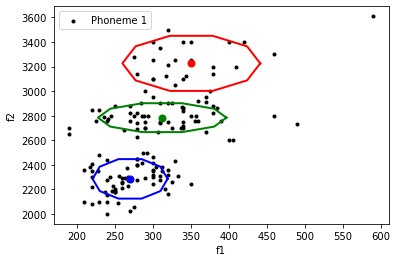

Mean values
[ 350.84195 3226.258  ]
[ 312.58786 2783.883  ]
[ 270.39523 2285.4656 ]

Covariances
[[ 4102.46790026     0.        ]
 [    0.         27850.45897731]]
[[3562.64986677    0.        ]
 [   0.         7655.83442535]]
[[ 1213.73776834     0.        ]
 [    0.         14278.4426294 ]]

Weights
[0.18390718 0.3809481  0.43514473]


Finished.

[[ 350.84195 3226.258  ]
 [ 312.58786 2783.883  ]
 [ 270.39523 2285.4656 ]] [[[ 4102.46790026     0.        ]
  [    0.         27850.45897731]]

 [[ 3562.64986677     0.        ]
  [    0.          7655.83442535]]

 [[ 1213.73776834     0.        ]
  [    0.         14278.4426294 ]]]


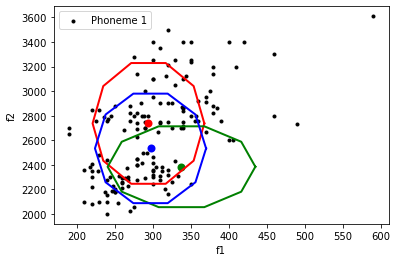

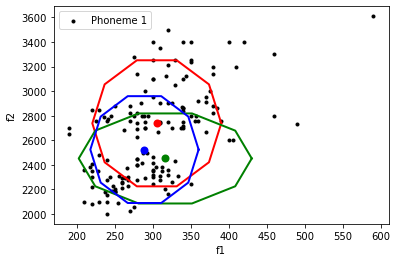

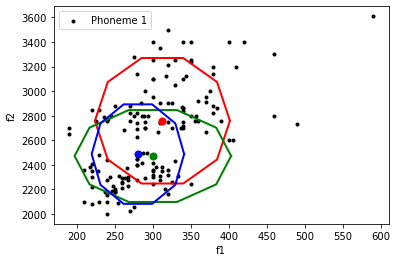

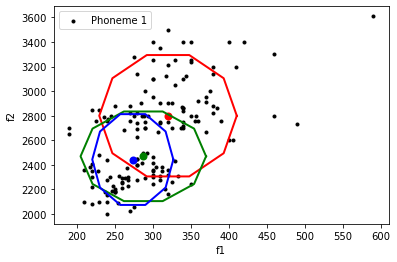

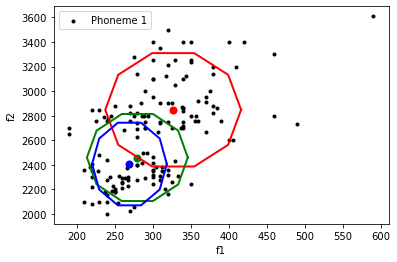

...

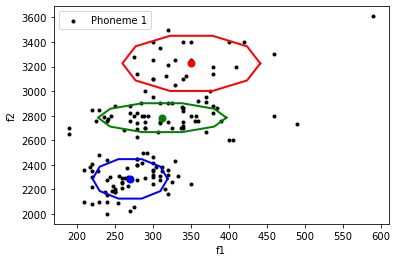

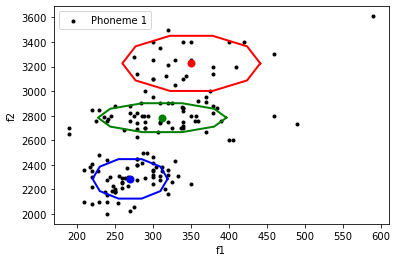

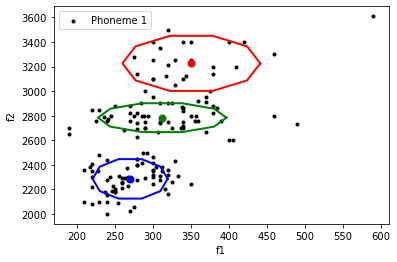

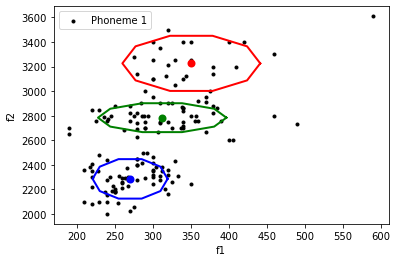

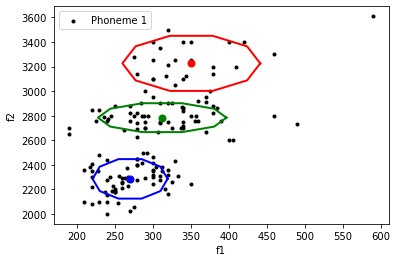

In [3155]:
# get number of samples
N = X.shape[0]
# get dimensionality of our dataset
D = X.shape[1]
# common practice : GMM weights initially set as 1/k
p = np.ones((k))/k
# GMM means are picked randomly from data samples
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
# covariance matrices
s = np.zeros((k,D,D)) # shape kxDxD
# number of iterations for the EM algorithm
n_iter = 100

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    # initially set to fraction of data covariance
    s[i,:,:] = cov_matrix/k

# Initialize array Z that will get the predictions of each Gaussian on each sample
Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
n_iter = 100

for t in range(n_iter):
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')

    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with diagonal covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)
        coef_1 = (X.transpose() - mu_i_repeated)**2
        coef_2 = Z[:,i]/np.sum(Z[:,i])
        coef_2 = np.expand_dims(coef_2, axis=1)
        res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
        s[i,:,:] = np.diag(res_1)
        
        p[i] = np.mean(Z[:,i])     
    fig, ax1 = plt.subplots()
    plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
    print('Mean values')
    for i in range(k):
        print(mu[i])
    print('')
    print('Covariances')
    for i in range(k):
        print(s[i,:,:])
    print('')
    print('Weights')
    print(p)
    print('')
    
print('\nFinished.\n')
print(mu, s)
save_model(mu, s, p)


### <font color="maroon"> Q2. Run the code multiple times for $K=3$, what do you observe? Use figures and the printed MoG parameters to support your arguments [2 mark] </font>
###  Q3. Repeat the training for phoneme_id = 2  and save the parameters [1 mark] 
### Q4. Repeat training for $K=6$ for phoneme_id =1 and phoneme_id=2 and save the model parameters [1 mark] 

Save your MoG model: this should comprise the variables mu, s and p. Include the all the saved model parameters in the submission .zip folder.

In [3156]:
def print_GMM_params(k, mu, s, p):
    ## Printing the Implemented GMM and Mean values
    print('Mean values')
    for i in range(k):
        print(mu[i])
    print('')
    print('Covariances')
    for i in range(k):
        print(s[i,:,:])
    print('')
    print('Weights')
    print(p)
    print('')

In [3157]:
## Printing the Implemented GMM and Mean values
print_GMM_params(k,mu,s,p)

Mean values
[ 350.84195 3226.258  ]
[ 312.58786 2783.883  ]
[ 270.39523 2285.4656 ]

Covariances
[[ 4102.46790026     0.        ]
 [    0.         27850.45897731]]
[[3562.64986677    0.        ]
 [   0.         7655.83442535]]
[[ 1213.73776834     0.        ]
 [    0.         14278.4426294 ]]

Weights
[0.18390718 0.3809481  0.43514473]



In [3158]:
##Storing the GMM parameters
GMM_parameters = {}
GMM_parameters['mu'] = mu
GMM_parameters['s'] = s
GMM_parameters['p'] = p


In [3159]:
def train_models(X, p_id, k):
    # get number of samples
    N = X.shape[0]
    # get dimensionality of our dataset
    D = X.shape[1]
    # common practice : GMM weights initially set as 1/k
    p = np.ones((k))/k
    # GMM means are picked randomly from data samples
    random_indices = np.floor(N*np.random.rand((k)))
    random_indices = random_indices.astype(int)
    mu = X[random_indices,:] # shape kxD
    # covariance matrices
    s = np.zeros((k,D,D)) # shape kxDxD
    # number of iterations for the EM algorithm
    n_iter = 100
    
    # initialize covariances
    for i in range(k):
        cov_matrix = np.cov(X.transpose())
        # initially set to fraction of data covariance
        s[i,:,:] = cov_matrix/k
    
    # Initialize array Z that will get the predictions of each Gaussian on each sample
    Z = np.zeros((N,k)) # shape Nxk
    
    ###############################
    # run Expectation Maximization algorithm for n_iter iterations
    n_iter = 100
    for t in range(n_iter):
        print('Iteration {:03}/{:03}'.format(t+1, n_iter))
    
        # Do the E-step
        Z = get_predictions(mu, s, p, X)
        Z = normalize(Z, axis=1, norm='l1')
    
        # Do the M-step:
        for i in range(k):
            mu[i,:] = np.matmul(X.transpose(),Z[:,i]) / np.sum(Z[:,i])
    
            ###################################################
            # We will fit Gaussians with diagonal covariance matrices:
            mu_i = mu[i,:]
            mu_i = np.expand_dims(mu_i, axis=1)
            mu_i_repeated = np.repeat(mu_i, N, axis=1)
            coef_1 = (X.transpose() - mu_i_repeated)**2
            coef_2 = Z[:,i]/np.sum(Z[:,i])
            coef_2 = np.expand_dims(coef_2, axis=1)
            res_1 = np.squeeze( np.matmul(coef_1, coef_2) )
            s[i,:,:] = np.diag(res_1)
            
            p[i] = np.mean(Z[:,i])
    
        fig, ax1 = plt.subplots()
        plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
    print('\nFinished.\n')
    print(mu, s)
    print_GMM_params(k,mu,s,p)
    GMM_parameters = {}
    GMM_parameters['mu'] = mu
    GMM_parameters['s'] = s
    GMM_parameters['p'] = p
  
    if not os.path.isdir('data/'):
     os.mkdir('data/')
    npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
    np.save(npy_filename, GMM_parameters)
    

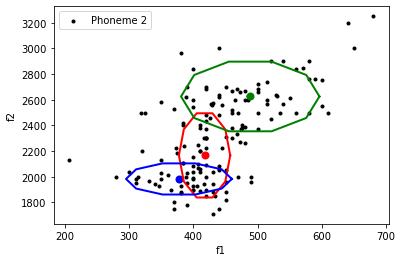


Finished.

[[ 417.24652 2165.9287 ]
 [ 488.35635 2625.0193 ]
 [ 377.29663 1982.4366 ]] [[[  797.95437408     0.        ]
  [    0.         59500.35702678]]

 [[ 5807.82033299     0.        ]
  [    0.         40695.38296591]]

 [[ 3392.52115088     0.        ]
  [    0.          8130.51682778]]]
Mean values
[ 417.24652 2165.9287 ]
[ 488.35635 2625.0193 ]
[ 377.29663 1982.4366 ]

Covariances
[[  797.95437408     0.        ]
 [    0.         59500.35702678]]
[[ 5807.82033299     0.        ]
 [    0.         40695.38296591]]
[[3392.52115088    0.        ]
 [   0.         8130.51682778]]

Weights
[0.34280462 0.42504812 0.23214725]



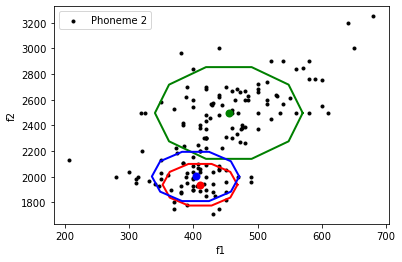

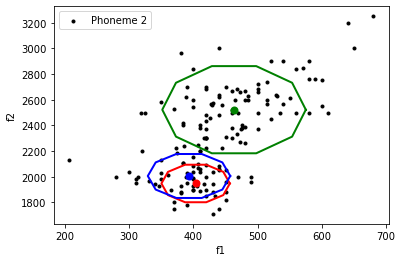

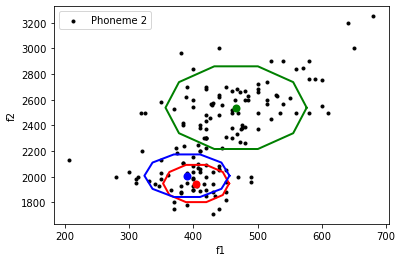

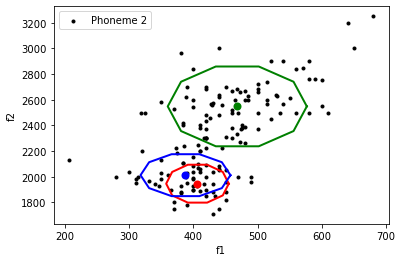

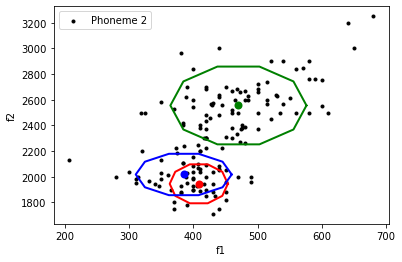

...

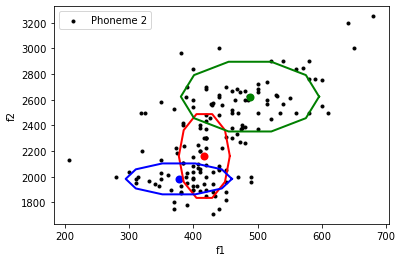

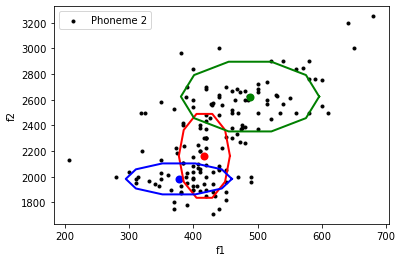

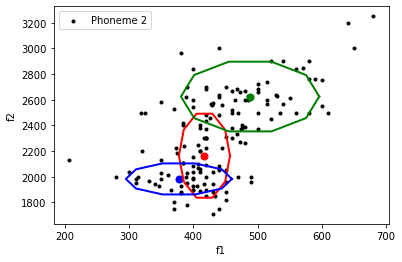

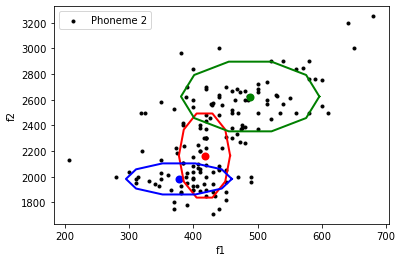

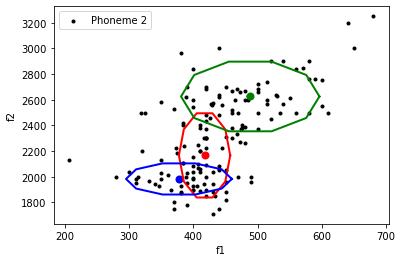

In [3160]:
#Q3
#for phoneme_id = 2
k_3 = 3
# id of the phoneme that will be used (e.g. 1, or 2)
p_id_ph2 = 2
X_ph2_k3 = X_full[phoneme_id==p_id_ph2,:]
train_models(X_ph2_k3, p_id_ph2, k_3)

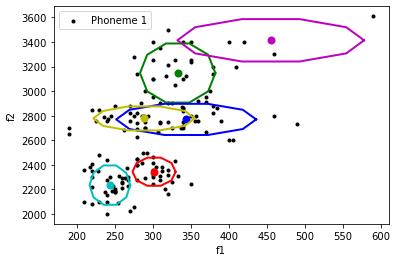


Finished.

[[ 301.89035 2343.86   ]
 [ 332.948   3147.4656 ]
 [ 344.08676 2769.752  ]
 [ 243.85252 2234.578  ]
 [ 455.18924 3414.01   ]
 [ 288.54755 2777.971  ]] [[[  401.4254311      0.        ]
  [    0.          7240.04116312]]

 [[ 1225.346849       0.        ]
  [    0.         32055.79355021]]

 [[ 4231.01398531     0.        ]
  [    0.          8916.00764849]]

 [[  356.2767626      0.        ]
  [    0.         14193.16232347]]

 [[ 7523.25306571     0.        ]
  [    0.         16461.2953291 ]]

 [[ 2211.41202833     0.        ]
  [    0.          5284.64016952]]]
Mean values
[ 301.89035 2343.86   ]
[ 332.948  3147.4656]
[ 344.08676 2769.752  ]
[ 243.85252 2234.578  ]
[ 455.18924 3414.01   ]
[ 288.54755 2777.971  ]

Covariances
[[ 401.4254311     0.        ]
 [   0.         7240.04116312]]
[[ 1225.346849       0.        ]
 [    0.         32055.79355021]]
[[4231.01398531    0.        ]
 [   0.         8916.00764849]]
[[  356.2767626      0.        ]
 [    0.         14193.1

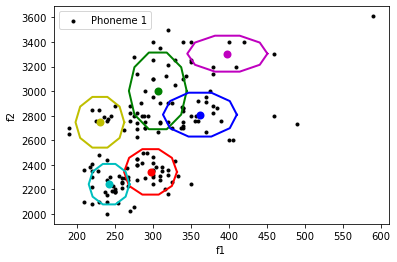

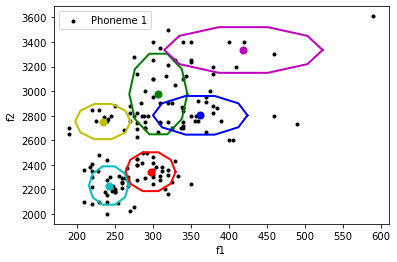

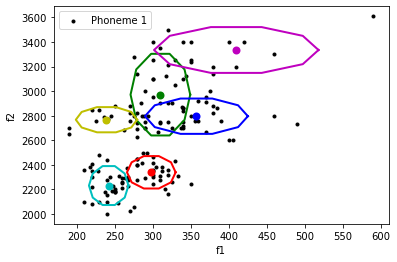

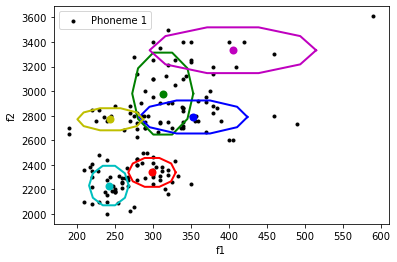

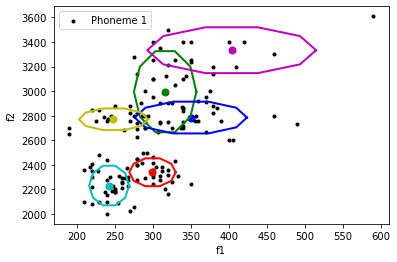

...

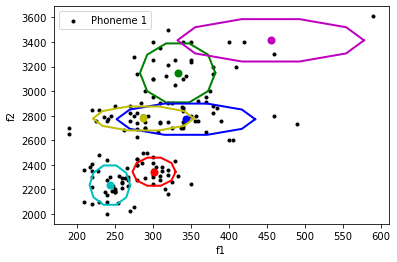

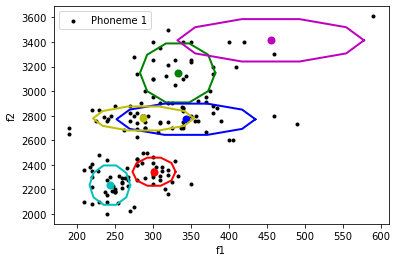

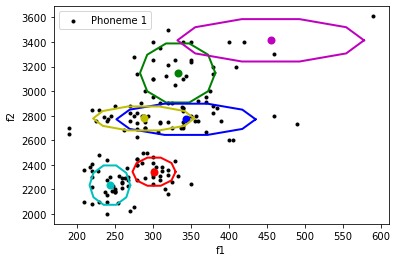

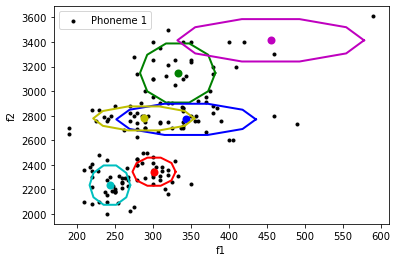

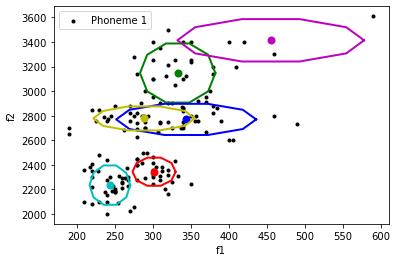

In [3161]:
### Q4
#for k = 6 & p_id = 1
k_6 = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id_ph1 = 1
X_ph1_k6 = X = X_full[phoneme_id==p_id_ph1,:]
train_models(X_ph1_k6, p_id_ph1, k_6)

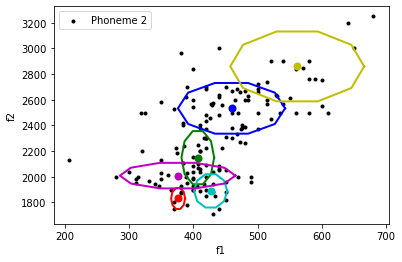


Finished.

[[ 376.03094 1830.3285 ]
 [ 406.73898 2148.247  ]
 [ 459.19907 2532.6384 ]
 [ 426.70697 1889.3401 ]
 [ 375.26804 2008.3462 ]
 [ 561.49097 2859.037  ]] [[[   59.39343956     0.        ]
  [    0.          3677.77558918]]

 [[  324.21708221     0.        ]
  [    0.         23704.10484177]]

 [[ 3482.43561313     0.        ]
  [    0.         21571.37391098]]

 [[  335.11735267     0.        ]
  [    0.          9286.33011633]]

 [[ 4045.41668691     0.        ]
  [    0.          5480.68541868]]

 [[ 5435.89961233     0.        ]
  [    0.         40919.2306746 ]]]
Mean values
[ 376.03094 1830.3285 ]
[ 406.73898 2148.247  ]
[ 459.19907 2532.6384 ]
[ 426.70697 1889.3401 ]
[ 375.26804 2008.3462 ]
[ 561.49097 2859.037  ]

Covariances
[[  59.39343956    0.        ]
 [   0.         3677.77558918]]
[[  324.21708221     0.        ]
 [    0.         23704.10484177]]
[[ 3482.43561313     0.        ]
 [    0.         21571.37391098]]
[[ 335.11735267    0.        ]
 [   0.         9286

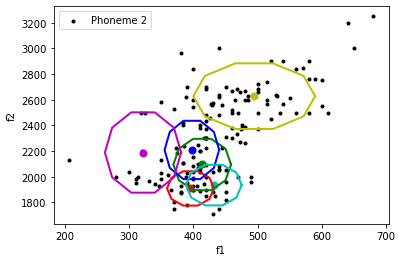

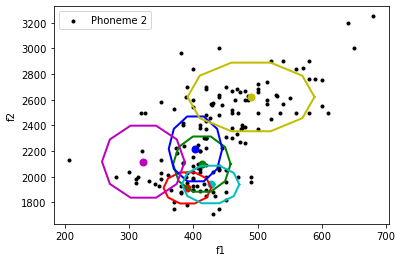

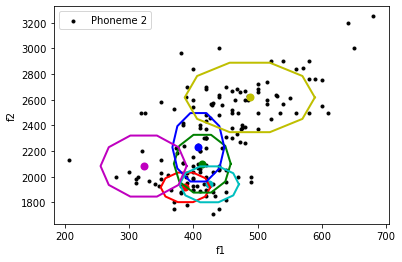

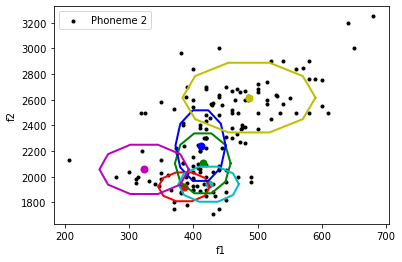

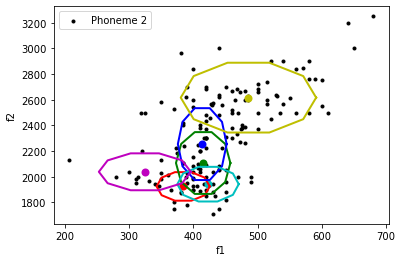

...

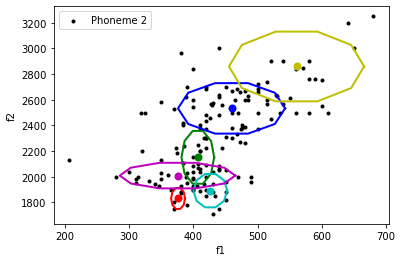

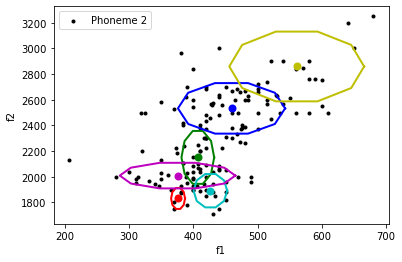

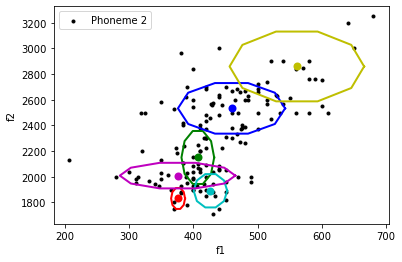

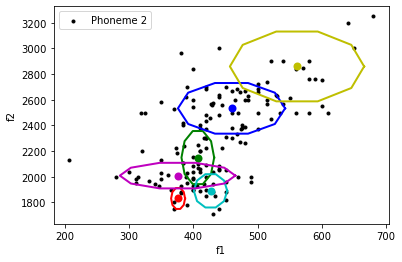

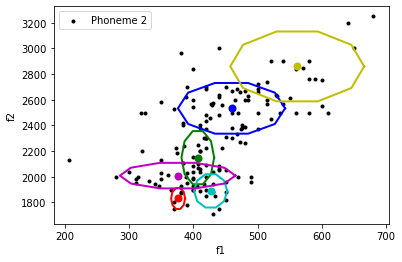

In [3162]:
### Q4
#for k = 6 & p_id = 2
k_6 = 6
# id of the phoneme that will be used (e.g. 1, or 2)
p_id_ph2 = 2
X_ph2_k6 = X_full[phoneme_id==p_id_ph2,:]
train_models(X_ph2_k6, p_id_ph2, k_6)

### <font color="maroon"> Q5. Use the 2 MoGs ($K=3$) learnt in tasks 2 & 3 to build a classifier to discriminate between phonemes 1 and 2, and explain the process in the report [4 marks] </font>

Classify using the Maximum Likelihood (ML) criterion and calculate the miss-classification error. Remember that a classification under the ML compares $p(\mathbf{x};\boldsymbol\theta_{1})$, where $\boldsymbol\theta_{1}$ are the parameters of the MoG learnt for the first phoneme, with $p(\mathbf{x};\boldsymbol\theta_{2})$, where $\boldsymbol\theta_{2}$  are the parameters of the MoG learnt for the second phoneme. 

In [3163]:
def get_accuracy(y_true, y_pred):
    correct_predicted = 0
    for true_label,predicted in zip(y_true,y_pred):
        if true_label == predicted:
            correct_predicted +=1
    accuracy_score = correct_predicted / len(y_true)
    return accuracy_score * 100

In [3164]:
k = 3
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu = GMM_parameters_phoneme_1['mu']
s = GMM_parameters_phoneme_1['s']
p = GMM_parameters_phoneme_1['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1 = np.zeros((N,k)) # shape Nxk

# get predictions
###your code here
Z_phoneme_1 = get_predictions(mu, s, p, X)
pred_1 = Z_phoneme_1.astype(np.float32)
pred_1 = pred_1.sum(axis=1)

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
npy_filename2 = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
GMM_parameters_phoneme_2 = np.load(npy_filename2, allow_pickle=True)
GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)
mu_2 = GMM_parameters_phoneme_2['mu']
s_2 = GMM_parameters_phoneme_2['s']
p_2 = GMM_parameters_phoneme_2['p']
# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_2 = np.zeros((N,k)) # shape Nxk
Z_phoneme_2 = get_predictions(mu_2, s_2, p_2, X)
pred_2 = Z_phoneme_2.astype(np.float32)
pred_2 = pred_2.sum(axis=1)
###your code here
predClass = []
for p1,p2 in zip(pred_1, pred_2):
    if p1 > p2:
        predClass.append(0.0)
    else:
        predClass.append(1.0)

y_pred = np.array(predClass)

y_true = np.concatenate((np.zeros((np.sum(phoneme_id==1))),np.ones((np.sum(phoneme_id==2)))),axis =0)

computed_accuracy = accuracy_score(y_true,y_pred)
print('Accuracy using GMMs with {} components: {:.2f}%'.format(k, computed_accuracy*100))
confusion_matrix = metrics.confusion_matrix(y_true, y_pred)
TP = confusion_matrix[1, 1]
TN = confusion_matrix[0, 0]
FP = confusion_matrix[0, 1]
FN = confusion_matrix[1, 0]
print()
classification_error = (FP + FN) / float(TP + TN + FP + FN)
print('Mis-classification error using GMMs with {} components: {:.2f}%'.format(3, classification_error*100))
# classify each point using Maximum Likelihood

### your code here

# calculate accuracy
### your code here


Accuracy using GMMs with 3 components: 96.38%

Mis-classification error using GMMs with 3 components: 3.62%


In [3165]:
k = 6
inds_1 = np.where(phoneme_id==1)
inds_2 = np.where(phoneme_id==2)
inds_1 = inds_1[0]
inds_2 = inds_2[0]
inds_1_and_2 = np.concatenate((inds_1, inds_2), axis=0)

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 1
p_id = 1
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
print(npy_filename)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1_k6 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1_k6 = np.ndarray.tolist(GMM_parameters_phoneme_1_k6)
else:
    raise('File {} does not exist.'.format(npy_filename))
mu_k6 = GMM_parameters_phoneme_1_k6['mu']
s_k6 = GMM_parameters_phoneme_1_k6['s']
p_k6 = GMM_parameters_phoneme_1_k6['p']

# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_1_k6 = np.zeros((N,k)) # shape Nxk

# get predictions
###your code here
Z_phoneme_1_k6 = get_predictions(mu_k6, s_k6, p_k6, X)
pred_1_k6 = Z_phoneme_1_k6.astype(np.float32)
pred_1_k6 = pred_1_k6.sum(axis=1)

# Get predictions on both phonemes 1 and 2, from a GMM with k components, pretrained on phoneme 2
p_id = 2
npy_filename2 = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(p_id, k)
print(npy_filename2)
GMM_parameters_phoneme_2_k6 = np.load(npy_filename2, allow_pickle=True)
GMM_parameters_phoneme_2_k6 = np.ndarray.tolist(GMM_parameters_phoneme_2_k6)
mu_2_k6 = GMM_parameters_phoneme_2_k6['mu']
s_2_k6 = GMM_parameters_phoneme_2_k6['s']
p_2_k6 = GMM_parameters_phoneme_2_k6['p']
# Initialize array Z_phoneme_1 that will get the predictions of each Gaussian on each sample
Z_phoneme_2_k6 = np.zeros((N,k)) # shape Nxk
Z_phoneme_2_k6 = get_predictions(mu_2_k6, s_2_k6, p_2_k6, X)
pred_2_k6 = Z_phoneme_2_k6.astype(np.float32)
pred_2_k6 = pred_2_k6.sum(axis=1)
###your code here
predClass = []
for p1,p2 in zip(pred_1_k6, pred_2_k6):
    if p1 > p2:
        predClass.append(0.0)
    else:
        predClass.append(1.0)

y_pred_k6 = np.array(predClass)
y_true_k6 = np.concatenate((np.zeros((np.sum(phoneme_id==1))),np.ones((np.sum(phoneme_id==2)))),axis =0)
accuracy_k6 = accuracy_score(y_pred_k6,y_true_k6)
print('Accuracy using GMMs with {} components: {:.2f}%'.format(k, accuracy_k6*100))
# classify each point using Maximum Likelihood

### your code here

# calculate accuracy
### your code here
classification_report_k6 = metrics.classification_report(y_true_k6, y_pred_k6, target_names=['Phoneme 1', 'Phoneme 2'])
print(classification_report_k6)
confusion_matrix_k6 = metrics.confusion_matrix(y_true_k6, y_pred_k6)
TP_k6 = confusion_matrix_k6[1, 1]
TN_k6 = confusion_matrix_k6[0, 0]
FP_k6 = confusion_matrix_k6[0, 1]
FN_k6 = confusion_matrix_k6[1, 0]
print()
classification_error_k6 = (FP_k6 + FN_k6) / float(TP_k6 + TN_k6 + FP_k6 + FN_k6)
print('Mis-classification error using GMMs with {} components: {:.2f}%'.format(3, classification_error_k6*100))

data/GMM_params_phoneme_01_k_06.npy
data/GMM_params_phoneme_02_k_06.npy
Accuracy using GMMs with 6 components: 95.72%
              precision    recall  f1-score   support

   Phoneme 1       0.95      0.96      0.96       152
   Phoneme 2       0.96      0.95      0.96       152

    accuracy                           0.96       304
   macro avg       0.96      0.96      0.96       304
weighted avg       0.96      0.96      0.96       304


Mis-classification error using GMMs with 3 components: 4.28%


### <font color="maroon"> Q6. Repeat for $K=6$ and compare the results in terms of accuracy. [2 mark] </font>


### <font color="maroon"> Q7. Display a "classification matrix" assigning labels to a grid of all combinations of the $F1$ and $F2$ features for the $K=3$ classifiers from above. Next, repeat this step for $K=6$ and compare the two. [3 marks] </font>

In particular,
create a custom uniform grid of points that spans all possible intermediate combinations of $F1$ and $F2$ features, using the features' minimum and maximum values as the limits. (Hint: check documentation for [np.meshgrid](https://numpy.org/doc/stable/reference/generated/numpy.meshgrid.html) and [np.linspace](https://numpy.org/doc/stable/reference/generated/numpy.linspace.html) ). Classify each point in the grid using one of your classifiers. That is, create a classification matrix, $\mathbf{M}$, whose elements are either 0 or 1. $M(i,j)$ is 0 if the point at location $(i,j)$ on the custom grid is classified as belonging to phoneme 1, and is 1 otherwise.

### Hint: building the custom grid:
Assuming our data were the orange points below, the custom grid would look something like the following (evenly spaced points spanning the minimum to maximum values of both features):

![](https://i.imgur.com/khfYx42.png)



In [3166]:
def get_predicted_value(k,gird_val, data_phoneme_01, data_phoneme_02):
    Z_phoneme_01 = get_predictions(data_phoneme_01['mu'], data_phoneme_01['s'], data_phoneme_01['p'], gird_val)
    Z_phoneme_01_sum = np.sum(Z_phoneme_01,axis=1)
    Z_phoneme_02 = get_predictions(data_phoneme_02['mu'], data_phoneme_02['s'], data_phoneme_02['p'], gird_val)
    Z_phoneme_02_sum = np.sum(Z_phoneme_02,axis=1)

    predClass = []
    # if sum of probabilities of any model is less than other mark it
    for z1,z2 in zip(Z_phoneme_01_sum,Z_phoneme_02_sum):
        if z1 > z2:
            predClass.append(0.0)
        else:
            predClass.append(1.0)

    y_pred = np.array(predClass)
    return y_pred

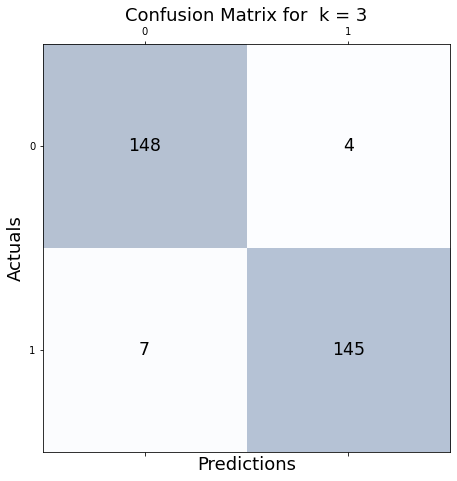

In [3167]:
### Q7 Display a "classification matrix"
### For k = 3
## Taking y_pred and y_true values from above
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(confusion_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confusion_matrix.shape[0]):
    for j in range(confusion_matrix.shape[1]):
        ax.text(x=j, y=i,s=confusion_matrix[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix for  k = 3', fontsize=18)
plt.show()

f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


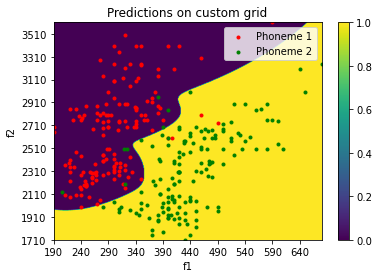

In [3168]:
k = 3

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################
# Write your code here

# Create a custom grid of shape N_f1 x N_f2
custom_grid = np.zeros((N_f1,N_f2,2))
# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
for i in range(N_f1):
    for j in range(N_f2):
        custom_grid[i][j] = [int(i + min_f1),(j + min_f2)]

# Do predictions, using GMM trained on phoneme 1, on custom grid
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(1, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))

# get predictions
###your code here

# Do predictions, using GMM trained on phoneme 2, on custom grid
npy_filename2 = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(2, k)
GMM_parameters_phoneme_2 = np.load(npy_filename2, allow_pickle=True)
GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)



# Compare these predictions, to classify each point of the grid
# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
########################################/
M = np.ndarray(shape=(N_f2, N_f1))
for i in range(0,N_f2):
    M[i,:] = get_predicted_value(3, custom_grid[:,i], GMM_parameters_phoneme_1, GMM_parameters_phoneme_2)


################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

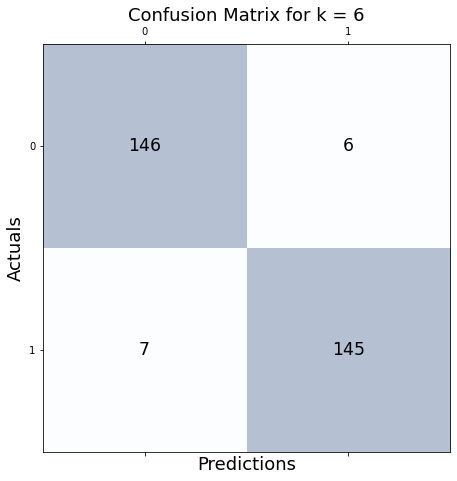

In [3169]:
### Q7 Display a "classification matrix"
### For k = 6
## Taking y_pred_k6 and y_true_k6 values from above
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(confusion_matrix_k6, cmap=plt.cm.Blues, alpha=0.3)
for i in range(confusion_matrix_k6.shape[0]):
    for j in range(confusion_matrix_k6.shape[1]):
        ax.text(x=j, y=i,s=confusion_matrix_k6[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix for k = 6', fontsize=18)
plt.show()

f1 range: 190-680 | 490 points
f2 range: 1710-3610 | 1900 points


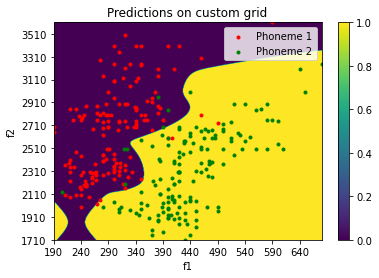

In [3170]:
k = 6

X = X_full[inds_1_and_2,:]

N = X.shape[0]
D = X.shape[1]

min_f1 = int(np.min(X[:,0]))
max_f1 = int(np.max(X[:,0]))
min_f2 = int(np.min(X[:,1]))
max_f2 = int(np.max(X[:,1]))
N_f1 = max_f1 - min_f1
N_f2 = max_f2 - min_f2
print('f1 range: {}-{} | {} points'.format(min_f1, max_f1, N_f1))
print('f2 range: {}-{} | {} points'.format(min_f2, max_f2, N_f2))

#########################################
# Write your code here

# Create a custom grid of shape N_f1 x N_f2
custom_grid = np.zeros((N_f1,N_f2,2))
# The grid will span all the values of (f1, f2) pairs, between [min_f1, max_f1] on f1 axis, and between [min_f2, max_f2] on f2 axis
# Then, classify each point [i.e., each (f1, f2) pair] of that grid, to either phoneme 1, or phoneme 2, using the two trained GMMs
for i in range(N_f1):
    for j in range(N_f2):
        custom_grid[i][j] = [int(i + min_f1),(j + min_f2)]

# Do predictions, using GMM trained on phoneme 1, on custom grid
npy_filename = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(1, k)
if os.path.isfile(npy_filename):
    GMM_parameters_phoneme_1 = np.load(npy_filename, allow_pickle=True)
    GMM_parameters_phoneme_1 = np.ndarray.tolist(GMM_parameters_phoneme_1)
else:
    raise('File {} does not exist.'.format(npy_filename))

# get predictions
###your code here

# Do predictions, using GMM trained on phoneme 2, on custom grid
npy_filename2 = 'data/GMM_params_phoneme_{:02}_k_{:02}.npy'.format(2, k)
GMM_parameters_phoneme_2 = np.load(npy_filename2, allow_pickle=True)
GMM_parameters_phoneme_2 = np.ndarray.tolist(GMM_parameters_phoneme_2)



# Compare these predictions, to classify each point of the grid
# Store these prediction in a 2D numpy array named "M", of shape N_f2 x N_f1 (the first dimension is f2 so that we keep f2 in the vertical axis of the plot)
# M should contain "0.0" in the points that belong to phoneme 1 and "1.0" in the points that belong to phoneme 2
########################################/
M = np.ndarray(shape=(N_f2, N_f1))
for i in range(0,N_f2):
    M[i,:] = get_predicted_value(3, custom_grid[:,i], GMM_parameters_phoneme_1, GMM_parameters_phoneme_2)


################################################
# Visualize predictions on custom grid

# Create a figure
#fig = plt.figure()
fig, ax = plt.subplots()

# use aspect='auto' (default is 'equal'), to force the plotted image to be square, when dimensions are unequal
plt.imshow(M, aspect='auto')

# set label of x axis
ax.set_xlabel('f1')
# set label of y axis
ax.set_ylabel('f2')

# set limits of axes
plt.xlim((0, N_f1))
plt.ylim((0, N_f2))

# set range and strings of ticks on axes
x_range = np.arange(0, N_f1, step=50)
x_strings = [str(x+min_f1) for x in x_range]
plt.xticks(x_range, x_strings)
y_range = np.arange(0, N_f2, step=200)
y_strings = [str(y+min_f2) for y in y_range]
plt.yticks(y_range, y_strings)

# set title of figure
title_string = 'Predictions on custom grid'
plt.title(title_string)

# add a colorbar
plt.colorbar()

N_samples = int(X.shape[0]/2)
plt.scatter(X[:N_samples, 0] - min_f1, X[:N_samples, 1] - min_f2, marker='.', color='red', label='Phoneme 1')
plt.scatter(X[N_samples:, 0] - min_f1, X[N_samples:, 1] - min_f2, marker='.', color='green', label='Phoneme 2')

# add legend to the subplot
plt.legend()
plt.show()

Create a new dataset that will contain 3 columns, as follows: 
\begin{equation}
    X = [F1, F2, F1+F2]
\end{equation}

### <font color="maroon"> Q8. Try to fit a MoG model to the new data. What is the problem that you observe? Explain why it occurs [2 marks]

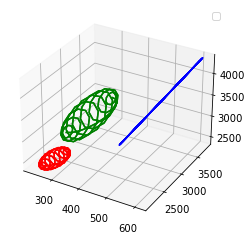

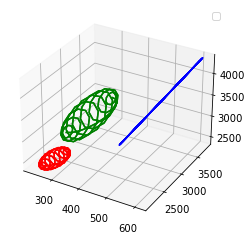

Implemented GMM | Mean values
[ 270.35016 2271.1824  2541.5325 ]
[ 315.7896 2877.8364 3193.6262]
[ 540.0022 3170.019  3710.0212]
Implemented GMM | Covariances
[[ 1187.87990158  1264.71779122  2452.5966928 ]
 [ 1264.71779122 13008.08932515 14272.80611637]
 [ 2452.5966928  14272.80611637 16725.40380917]]
[[ 3023.81011706  5190.79835429  8214.60747135]
 [ 5190.79835429 70425.37137705 75616.16873132]
 [ 8214.60747135 75616.16873132 83830.77720269]]
[[  2500.00099528  21999.99995846  24499.99995374]
 [ 21999.99995846 193600.00063447 215599.99959293]
 [ 24499.99995374 215599.99959293 240100.00054668]]
Implemented GMM | Weights
[0.38461053 0.60223215 0.01315732]



In [3171]:
p_id = 1 # id of the phoneme that will be used (e.g. 1, or 2)

k = 3 # number of GMM components
X = []
X = np.zeros((len(f1), 3))
#########################################
# Write your code here
# The shape of X is be two-dimensional. Each row will represent a sample of the dataset, and each column will represent a feature (e.g. f1 or f2 or f1+f2)
# Store f1 in the first column of X, f2 in the second column of X and f1+f2 in the third column of X

# Filter X to, contain only samples that belong to the chosen phoneme.
X[:, 0] = f1
X[:, 1] = f2
X[:, 2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id == p_id, :]
X = X_phoneme.copy()





#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        # Solving the singularity problem by making sure that diagonal entries of covarience matrix do not reach zero
        # Multipled with 0.001 to force the diagonal entries to never reach zero.
        s[i,:,:] += 0.001 * np.identity(D)
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()
print('Implemented GMM | Mean values')
for i in range(k):
    print(mu[i])
print('Implemented GMM | Covariances')
for i in range(k):
    print(s[i,:,:])
print('Implemented GMM | Weights')
print(p)
print('')

### <font color="maroon"> Q9. Suggest ways of overcoming the singularity problem and implement one of them. Show any training outputs in the report and discuss. [3 marks] </font>

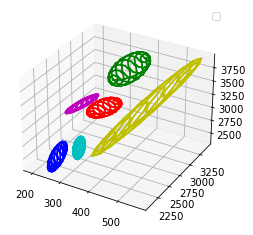

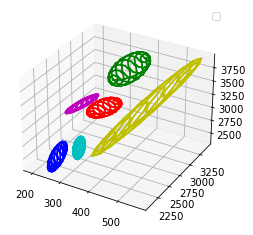

Implemented GMM | Mean values
[ 321.2314 2789.7302 3110.9614]
[ 341.15964 3224.889   3566.0486 ]
[ 244.85951 2235.8257  2480.6853 ]
[ 303.9684 2350.935  2654.9036]
[ 238.11461 2806.398   3044.5125 ]
[ 462.87085 2838.94    3301.8108 ]
Implemented GMM | Covariances
[[ 1541.42760124   935.4057931   2476.83239435]
 [  935.4057931   7035.90672748  7971.31152056]
 [ 2476.83239435  7971.31152056 10448.14491492]]
[[ 2037.09193496  1240.06189824  3277.1528332 ]
 [ 1240.06189824 19770.41329315 21010.47419139]
 [ 3277.1528332  21010.47419139 24287.62802459]]
[[ 3.60969227e+02 -3.50262108e+02  1.07061190e+01]
 [-3.50262108e+02  1.34113931e+04  1.30611300e+04]
 [ 1.07061190e+01  1.30611300e+04  1.30718371e+04]]
[[ 314.10738116 -774.60867211 -460.50229095]
 [-774.60867211 7343.80342463 6569.19375251]
 [-460.50229095 6569.19375251 6108.69246155]]
[[  951.83314376  2217.97535322  3169.80749697]
 [ 2217.97535322  7245.71804423  9463.69239744]
 [ 3169.80749697  9463.69239744 12633.50089442]]
[[  5500.02

In [3172]:
#########################################
# Write your code here
p_id = 1 # id of the phoneme that will be used (e.g. 1, or 2)

k = 6 # number of GMM components
X = []
X = np.zeros((len(f1), 3))
#########################################
# Write your code here
# The shape of X is be two-dimensional. Each row will represent a sample of the dataset, and each column will represent a feature (e.g. f1 or f2 or f1+f2)
# Store f1 in the first column of X, f2 in the second column of X and f1+f2 in the third column of X

# Filter X to, contain only samples that belong to the chosen phoneme.
X[:, 0] = f1
X[:, 1] = f2
X[:, 2] = f1 + f2
X = X.astype(np.float32)
X_phoneme = np.zeros((np.sum(phoneme_id==p_id), 2))
X_phoneme = X[phoneme_id == p_id, :]
X = X_phoneme.copy()





#########################################
fig = plt.figure()
ax1 = plt.axes(projection='3d')
title_string = 'Phoneme {}'.format(p_id)
plot_data_3D(X=X, title_string=title_string, ax=ax1)

N, D = X.shape
p = np.ones((k))/k
random_indices = np.floor(N*np.random.rand((k)))
random_indices = random_indices.astype(int)
mu = X[random_indices,:] # shape kxD
s = np.zeros((k,D,D)) # shape kxDxD
n_iter = 150

# initialize covariances
for i in range(k):
    cov_matrix = np.cov(X.transpose())
    s[i,:,:] = cov_matrix/k

Z = np.zeros((N,k)) # shape Nxk

###############################
# run Expectation Maximization algorithm for n_iter iterations
for t in range(n_iter):
    #print('****************************************')
    print('Iteration {:03}/{:03}'.format(t+1, n_iter))

    # Do the E-step
    Z = get_predictions(mu, s, p, X)
    Z = normalize(Z, axis=1, norm='l1')
    # Do the M-step:
    for i in range(k):
        mu[i,:] = np.matmul(X.transpose(), Z[:,i])/np.sum(Z[:,i])

        ###################################################
        # We will fit Gaussians with full covariance matrices:
        mu_i = mu[i,:]
        mu_i = np.expand_dims(mu_i, axis=1)
        mu_i_repeated = np.repeat(mu_i, N, axis=1)

        term_1 = X.transpose() - mu_i_repeated
        term_2 = np.repeat(np.expand_dims(Z[:,i], axis=1), D, axis=1) * term_1.transpose()
        s[i,:,:] = np.matmul(term_1, term_2)/np.sum(Z[:,i])
        # Solving the singularity problem by making sure that diagonal entries of covarience matrix do not reach zero
        # Multipled with 0.001 to force the diagonal entries to never reach zero.
        s[i,:,:] += 0.001 * np.identity(D)
        p[i] = np.mean(Z[:,i])

plot_gaussians(ax1, 2*s, mu, X, 'Phoneme {}'.format(p_id))
plt.show()
print('Implemented GMM | Mean values')
for i in range(k):
    print(mu[i])
print('Implemented GMM | Covariances')
for i in range(k):
    print(s[i,:,:])
print('Implemented GMM | Weights')
print(p)
print('')